# Spatial Temporal Regression

This notebook illustrates fitting a Guassian process for daily average Nitrous Oxide levels with data from all sites on all dates after number 345.

## 0. Prepare Environment

In [1]:
# Import external packages
import numpy as np
import pandas as pd

In [2]:
# Import spatial temporal Gaussian process class
from stgp.STGP import STGP

## 1. Load Dataset

In [3]:
# Load air quality dataset
df = pd.read_csv('..\Data processing\Daily avg air quality data 21-04-2020 to 2021 with site \
data.csv')
print(df.shape)
print(df.head())

(16104, 11)
                Site  Lat.South  Long.East  Alt.AHD  Date  PM10.24h.mcrg.m3  \
0             ALBURY  -36.05183  146.93980      182     1               NaN   
1              BARGO  -34.30630  150.58060      365     1               NaN   
2           BATHURST  -33.40192  149.57459      625     1               NaN   
3         BERESFIELD  -32.79679  151.66102       14     1               NaN   
4  BRADFIELD HIGHWAY  -33.84343  151.21142       36     1               NaN   

   CO.24h.ppm  SO2.24h.pphm  NO.24h.pphm  NO2.24h.pphm  OZONE.24h.pphm.1  
0         NaN           NaN          NaN           NaN               NaN  
1         NaN           0.1          1.2           1.0               1.3  
2         NaN           NaN          NaN           NaN               NaN  
3         NaN           0.3          0.9           1.0               1.0  
4         0.2           0.2          5.3           2.7               0.5  


In [4]:
# Set temporal parameters
target_var = 'NO2.24h.pphm'
target_name = "Nitrous Oxide"
cov_func_name = "Squared exponential"
long_low = 146
long_up = 154
lat_low = -37
lat_up = -30
date_low = 340

## 2. Type II Likelihood Maximisation

In [5]:
# Create spatial temporal Gaussian Process
stgp = STGP(df, target_var, target_name, long_low, long_up, lat_low, lat_up, 
            date_low, cov_func_name)

# Make bounds for optimiser (log-scale) - Could try to find accuracy of air sensors
bounds = ((np.log(0.5 * stgp.hyper_params[0]), np.log(2 * stgp.hyper_params[0])), 
          (np.log(0.5 * stgp.hyper_params[1]), np.log(2 * stgp.hyper_params[1])), 
          (np.log(0.5 * stgp.hyper_params[2]), np.log(2 * stgp.hyper_params[2])), 
          (np.log(0.5 * stgp.sigma_n), np.log(2 * stgp.sigma_n)))

# Try to fit it - giving a long time-lengthscale so not changing much over time
stgp.fit(bounds = bounds, verbose = False)

# Plot it
stgp.plot_preds(save = True)

GP Optimising Hyper-parameters
Initial hyperparameter values: 
[0.949 2.709 0.114 0.316]
Hyperparameter bounds:
[[0.474 1.355 0.057 0.158]
 [1.897 5.419 0.229 0.632]]
Optimisation results: 
[1.057 1.356 0.23  0.633]
Log marginal likelihood
[-1114.27355583]
98.0% of data within 95% confidence interval


In [6]:
# Set covariance function to automatic relevance detection - multiple spatial lengthscales
cov_func_name = "ARD"

# Create spatial temporal Gaussian Process
stgp = STGP(df, target_var, target_name, long_low, long_up, lat_low, lat_up, 
            date_low, cov_func_name)

# Plot it
stgp.plot_preds()

91.0% of data within 95% confidence interval


## 3. Markov Chain Monte Carlo

### 3.1. Posterior Mean

In [7]:
# Load spatial hyperparameter samples from HMC
sthphmcdf = pd.read_csv('..\MCMC\D335_365_spatiotemporal_hyperparmetres10000.csv')
sthphmcdf.columns = ["l_long", "l_lat", "l_date", "sigma_f", "sigma_n"]
sthphmcdf = sthphmcdf[["sigma_f", "l_long", "l_lat", "l_date", "sigma_n"]]
print(sthphmcdf.shape)
print(sthphmcdf.head())

(10000, 5)
    sigma_f    l_long     l_lat    l_date   sigma_n
0  0.723807  0.094526  0.031761  0.261251  0.159050
1  0.752209  0.082849  0.042200  0.284361  0.173275
2  0.799439  0.076336  0.034899  0.249477  0.159487
3  0.651699  0.080156  0.038722  0.265065  0.181249
4  0.697646  0.082898  0.034274  0.259127  0.157619


In [8]:
# Reset date lower bound
date_low = 335

# Create spatial temporal Gaussian Process
stgphmc = STGP(df, target_var, target_name, long_low, long_up, lat_low, lat_up, 
            date_low, cov_func_name)

# Load temporal hyperparameter samples from HMC
stgphmc.load_hp_samps(sthphmcdf)

# Set Gaussian process to use posterior means of hyperparameters
stgphmc.set_post_mean()
stgphmc.plot_preds()

Posterior means of hyperparameters:
sigma_f    0.737084
l_long     0.080411
l_lat      0.038547
l_date     0.276156
sigma_n    0.162632
dtype: float64
81.0% of data within 95% confidence interval


### 3.2. Maximum A Posteriori

[0.71763871 0.07880603 0.03598962 0.27512429 0.16109673]
Maximum a posteriori estimates of hyperparameters:
['sigma_f' 'l_long' 'l_lat' 'l_date' 'sigma_n']
[0.71763871 0.07880603 0.03598962 0.27512429 0.16109673]


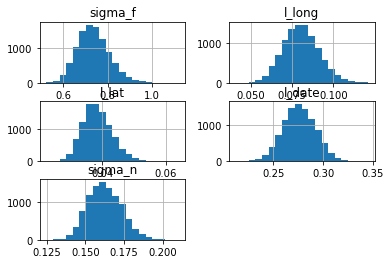

In [9]:
# Set Gaussian process to use maximum a posteriori hyperparameter values
stgphmc.set_max_post()

In [10]:
# Plot predictions from MAP hyperparameter estimates
stgp.plot_preds()

91.0% of data within 95% confidence interval


### 3.3. Posterior Credible Interval

In [11]:
# This is too slow
# stgp.plot_post(5)

## 4. Variational Inference

### 4.1. Posterior Mean

In [12]:
# Load spatial hyperparameter samples from HMC
sthpvidf = pd.read_csv('..\VI\VI_3D.csv')
sthpvidf.columns = ["l_long", "l_lat", "l_date", "sigma_f", "sigma_n"]
sthpvidf = sthpvidf[["sigma_f", "l_long", "l_lat", "l_date", "sigma_n"]]
print(sthpvidf.shape)
print(sthpvidf.head())

(1000, 5)
    sigma_f    l_long     l_lat    l_date   sigma_n
0  1.155849  1.086300  0.953469  0.986883  1.059481
1  0.981042  1.029143  0.967939  1.021124  1.106439
2  1.103806  1.106359  0.977855  0.967072  0.914348
3  1.001381  0.850172  1.192618  0.952682  1.007788
4  1.086765  1.085267  0.945022  1.124445  0.832066


In [13]:
# Reset date lower bound
date_low = 265

# Create spatial temporal Gaussian Process
stgpvi = STGP(df, target_var, target_name, long_low, long_up, lat_low, lat_up, 
            date_low, cov_func_name)

# Load temporal hyperparameter samples from HMC
stgpvi.load_hp_samps(sthpvidf)

# Set Gaussian process to use posterior means of hyperparameters
stgpvi.set_post_mean()
stgpvi.plot_preds()

Posterior means of hyperparameters:
sigma_f    1.007663
l_long     1.010854
l_lat      1.006103
l_date     0.993513
sigma_n    1.011336
dtype: float64
99.0% of data within 95% confidence interval


### 4.2. Maximum A Posteriori

[1.00038565 1.0033744  0.98944986 0.98347618 1.03258055]
Maximum a posteriori estimates of hyperparameters:
['sigma_f' 'l_long' 'l_lat' 'l_date' 'sigma_n']
[1.00038565 1.0033744  0.98944986 0.98347618 1.03258055]


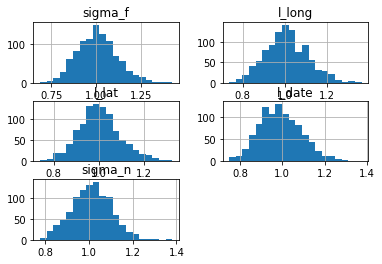

In [14]:
# Set Gaussian process to use maximum a posteriori hyperparameter values
stgpvi.set_max_post()

In [15]:
# Plot predictions from MAP hyperparameter estimates
stgpvi.plot_preds()

99.0% of data within 95% confidence interval


### 4.3. Posterior Credible Interval

In [16]:
# This is too slow
# stgpvi.plot_post()